In [1]:
# install required libraries
!pip install pydicom
!pip install imageio


[notice] A new release of pip is available: 23.0.1 -> 23.1
[notice] To update, run: python -m pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 23.1
[notice] To update, run: python -m pip install --upgrade pip


In [2]:
# import required libraries
import pydicom
import numpy as np
from PIL import Image
import imageio
from IPython.display import Image as IPythonImage

In [3]:
def load_dicom_image(file_path):
    """
    Load a DICOM image from a file and return it as a NumPy array.
    """
    ds = pydicom.dcmread(file_path)
    pixel_array = ds.pixel_array
    return pixel_array

In [4]:
def visualize_dicom_image(image_array):
    """
    Create a list of PIL Image objects from a NumPy array representing a DICOM image.
    """
    image_list = [Image.fromarray(frame) for frame in image_array]
    return image_list

In [5]:
def save_gif_image(image_list, file_path):
    """
    Save a list of PIL Image objects as a GIF image with a filename derived from the input file path.
    """
    file_name = file_path.split('/')[-1].split('.')[0]
    output_directory = "/".join(file_path.split('/')[:-1])+'/'
    output_file_path = f"{output_directory+file_name}.gif"
    image_list[0].save(output_file_path, format='GIF', append_images=image_list[1:], save_all=True, duration=100, loop=0)
    return output_file_path

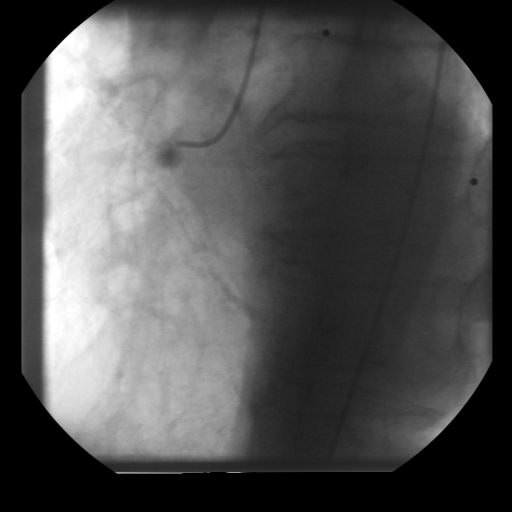

In [6]:
# Load the DICOM image
input_image_path = "/workspaces/codespaces-jupyter/data/0002.DCM"
image_array = load_dicom_image(input_image_path)

# Visualize the DICOM image as a list of PIL Image objects
image_list = visualize_dicom_image(image_array)

# Save the GIF image with a filename derived from the input DICOM file
output_file_path = save_gif_image(image_list, input_image_path)

# Display the output GIF image in the notebook
IPythonImage(filename=output_file_path, format='png')
